In [1]:
# Building a End to end multi class dog identification model to identify the breed of a dog.
# The data used is taken from the kaggle competition - Dog Breed Identification.

# The evaluation is a file with prediction probabilities for each breed of each test image.

# The data being handled is images(unstructured data).
# There are 120 breeds of dogs and 10,000+ images in the train and test datasets.


In [2]:
# from google.colab import drive
# drive.mount('/content/drive')  # Authorize access

In [3]:
# Replace with your actual ZIP file name and path
# !cp /content/dog-breed-identification.zip /content/drive/MyDrive/

In [4]:
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)

print("GPU", "available (Yes)") if tf.config.list_physical_devices("GPU") else print("GPU", "available (No)")

2.19.0
0.16.1
GPU available (Yes)


In [5]:
# !unzip "drive/MyDrive/Dog_vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog_vision/"

In [6]:
## Turning the data into tensors.
## Turning our data into numerical values. Tensors are just matrix form of data that can be runned on a gpu.

In [7]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog_vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [8]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

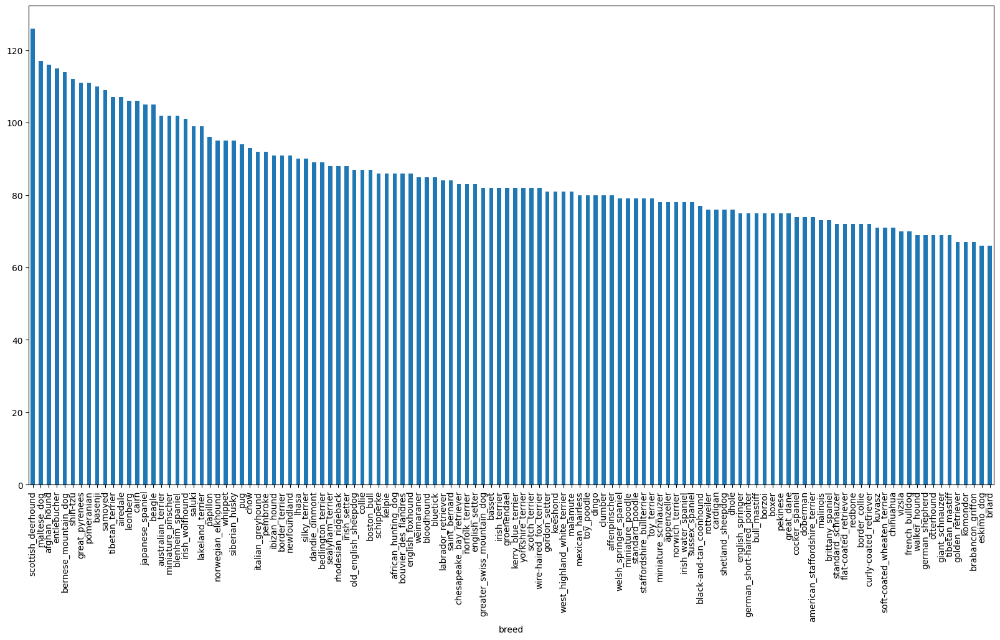

In [9]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [10]:
labels_csv["breed"].value_counts().median()

82.0

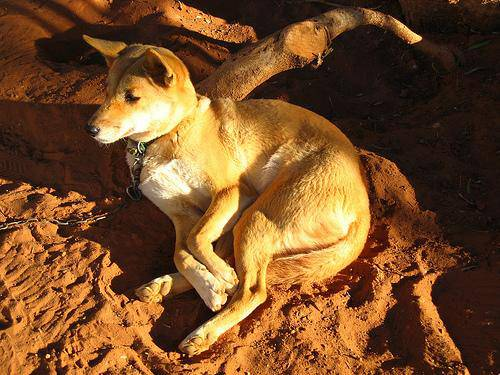

In [11]:
from IPython.display import Image
Image("drive/MyDrive/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

# Getting Images and their labels

In [12]:
filenames = ["drive/MyDrive/Dog_vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames

['drive/MyDrive/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog_vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog_vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog_vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog_vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [13]:
import os
if len(os.listdir("drive/MyDrive/Dog_vision/train")) == len(filenames):
  print("All images are there")
else:
  print("Not all images are there")

All images are there


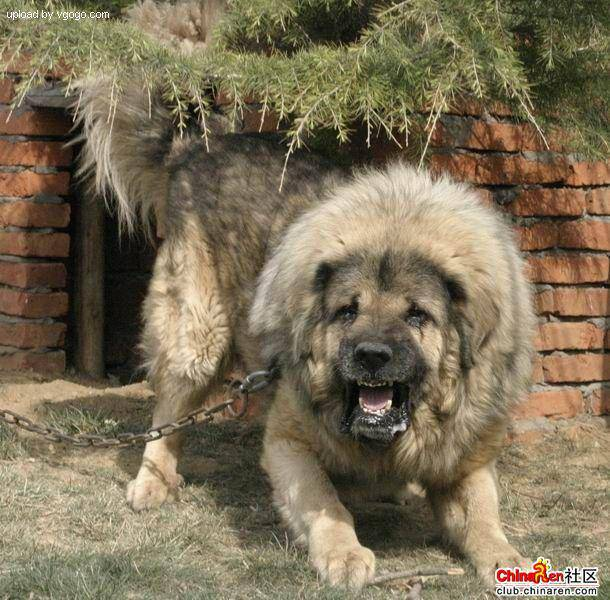

In [14]:
Image(filenames[9000])

In [15]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Let's prepare our labels.

In [16]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:
len(labels)

10222

In [18]:
# Checking any missing data
if len(labels) == len(filenames):
  print("No missing data")
else:
  print("Missing data")

No missing data


In [19]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [20]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [21]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
print(labels[0])
print(np.where(unique_breeds== labels[0]))
print(boolean_labels[0].argmax)
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
<built-in method argmax of numpy.ndarray object at 0x7f5d3c426df0>
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating own Validation Set

In [24]:
X = filenames
y = boolean_labels

In [25]:
# Setting the number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [26]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size = 0.3,
                                                   random_state = 42)

In [27]:
len(X_train), len(y_train), len(X_val), len(y_val)

(700, 700, 300, 300)

In [28]:
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog_vision/train/0d579f92d60935a54aa6dba6e6213257.jpg',
  'drive/MyDrive/Dog_vision/train/0a7f8d31c960071d0d4cfba36c0159c7.jpg',
  'drive/MyDrive/Dog_vision/train/0b97116ed04c8f0f7eb4a2b4b2620476.jpg',
  'drive/MyDrive/Dog_vision/train/0a27d304c96918d440e79e6e9e245c3f.jpg',
  'drive/MyDrive/Dog_vision/train/1352efb02c29ba1b9be918170afff486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### Preprocessing Images (turning images into Tensors)

In [29]:
## We will be taking the image as input and use tensorflow to read and save it to a variable. Turn our image into tensors. Further we resize the image to be a shape of (224, 224). Return the modified image.

In [30]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

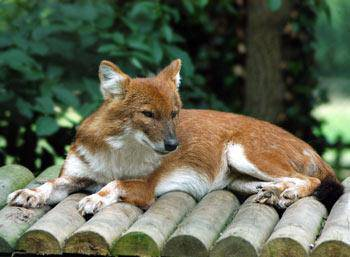

In [31]:
Image(filenames[42])

In [32]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [33]:
#Image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [34]:
IMG_SIZE = 224

# Function to preprocess for images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in an image path
  image = tf.io.read_file(image_path)
  # Turning the image into numerical Tensor with 3 color channels.
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [35]:
## Why turn data into batches?
## 10,000+ images might not fit in the memory in one go, that's why we take 32 images at a time.
## In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like `(image, label)`

In [36]:
def get_image_label(image_path, label):

  image = process_image(image_path)
  return image, label

In [37]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Function to turn all of our data (X & y) into batches

In [38]:
# Batch size would be 32 in the start
BATCH_SIZE = 32

# Function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data = False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # Valid dataset: no need to shuffle
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images.
    data = data.shuffle(buffer_size=len(X))

    # Create image, label tuple, image path to preprocessed image
    data = data.map(get_image_label)

    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [39]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [40]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [41]:
import matplotlib.pyplot as plt

# Create a function for visualizing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [42]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

In [43]:
unique_breeds[y[12].argmax()]

'maltese_dog'

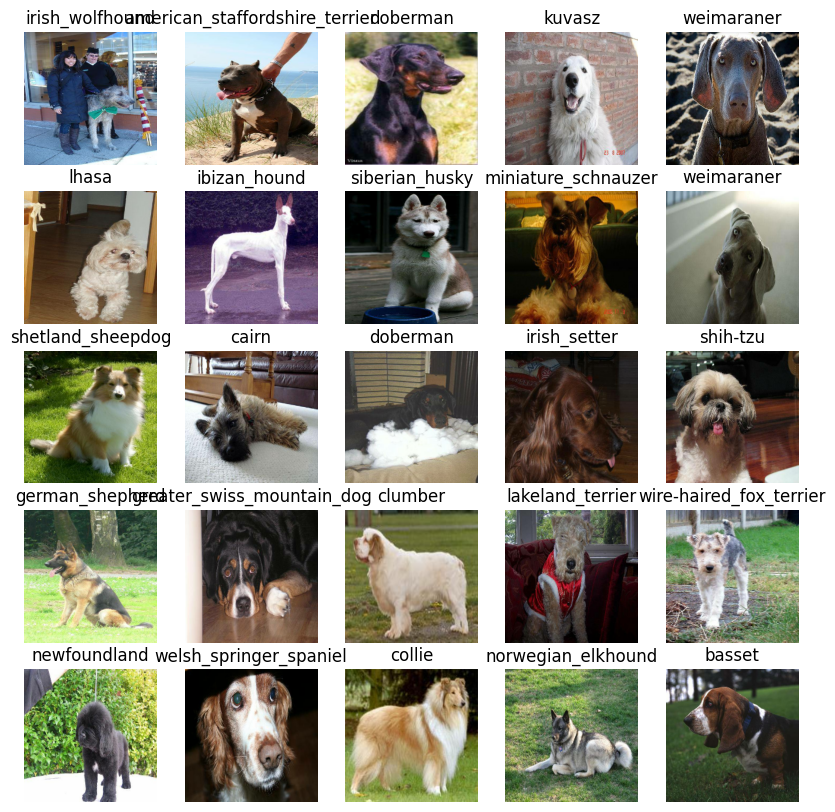

In [44]:
#It shuffles and shows different each time
train_images, train_labels = next(train_data.as_numpy_iterator())

show_25_images(train_images, train_labels)

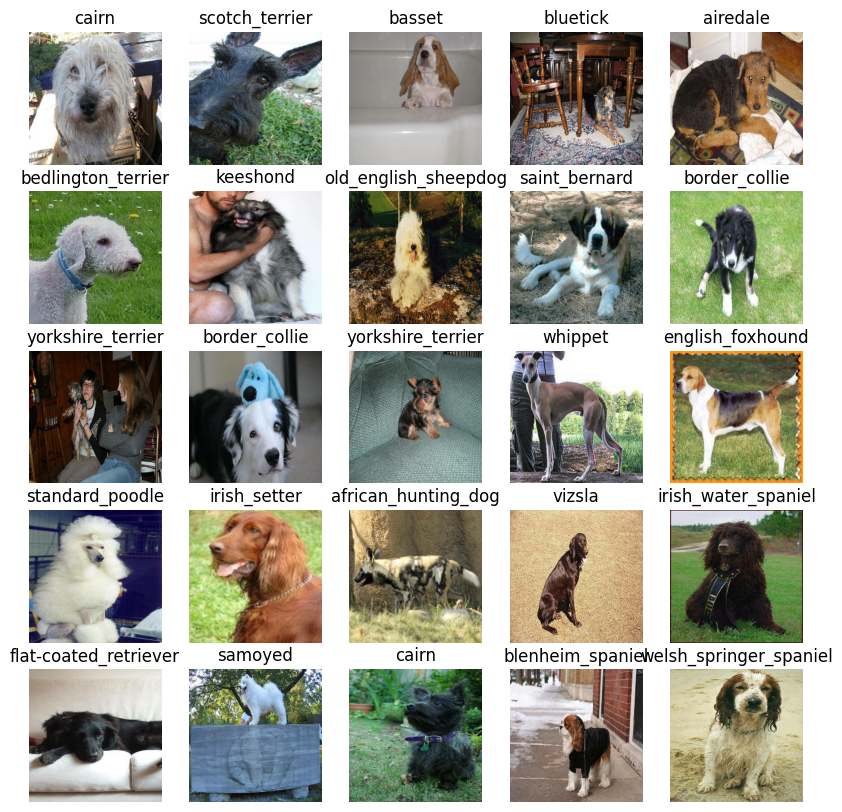

In [45]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Let's build a model

* The input -> our images in form of tensors.
* The output -> image labels in form of tensors.
* The URL of the model we want to use will be defined now.

In [46]:
# Setup image shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # None is batch

OUTPUT_SHAPE = len(unique_breeds)
# model zoo, pytorch, paperswithcode
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


In [47]:
import tf_keras
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  hubs_layer = hub.KerasLayer(MODEL_URL)

  model = tf_keras.Sequential([
      hubs_layer,
      tf_keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
  ])

  model.compile(
      loss = tf_keras.losses.CategoricalCrossentropy(),
      optimizer = tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

In [48]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks qre helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.
We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

In [49]:
# To setup a TensorBoard callback, we need to do 3 things:
# 1. Load the TensorBoard notebook extension
# 2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
# 3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [50]:
# TensorBoard CallBack
%load_ext tensorboard

In [51]:
import datetime

In [52]:
def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog_vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(log_dir = logdir)

In [53]:
# Early stopping CallBack
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model

Our first model would train on a 1000 images to reduce training time and checking everything.

In [54]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [55]:
# Final check to make sure we are working with GPU.
print("GPU", "available (Yes)") if tf.config.list_physical_devices("GPU") else print("GPU", "available (No)")

GPU available (Yes)


In [56]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [98]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
22/22 [==============================] - 10s 195ms/step - loss: 4.7028 - accuracy: 0.0886 - val_loss: 3.8242 - val_accuracy: 0.2000
Epoch 2/100
22/22 [==============================] - 6s 275ms/step - loss: 1.8039 - accuracy: 0.6471 - val_loss: 2.5771 - val_accuracy: 0.4300
Epoch 3/100
22/22 [==============================] - 4s 166ms/step - loss: 0.6635 - accuracy: 0.9100 - val_loss: 2.0121 - val_accuracy: 0.5367
Epoch 4/100
22/22 [==============================] - 3s 157ms/step - loss: 0.2797 - accuracy: 0.9900 - val_loss: 1.8067 - val_accuracy: 0.5900
Epoch 5/100
22/22 [==============================] - 5s 203ms/step - loss: 0.1571 - accuracy: 0.9929 - val_loss: 1.6976 - val_accuracy: 0.6000
Epoch 6/100
22/22 [==============================] - 3s 157ms/step - loss: 0.1058 - accuracy: 0.9986 - val_loss: 1.6415 - val_accuracy: 0.6133
Epoch 7/100
22/22 [=============================

### Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [57]:
%tensorboard --logdir drive/MyDrive/Dog_vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model.


In [58]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [99]:
predictions = model.predict(val_data, verbose = 1)
predictions

10/10 [==============================] - 2s 145ms/step


array([[4.42749879e-04, 3.89073066e-05, 1.76906574e-03, ...,
        3.64028907e-04, 2.96230955e-05, 2.56767939e-03],
       [9.51506430e-04, 4.08197113e-04, 1.34537891e-02, ...,
        9.81636913e-05, 1.87855284e-03, 1.47008195e-05],
       [1.52852117e-05, 6.55876138e-05, 1.19455595e-04, ...,
        3.06758971e-04, 5.16671571e-04, 6.46883389e-04],
       ...,
       [3.65281812e-05, 5.25315234e-04, 3.15805046e-05, ...,
        4.43965146e-05, 3.68036533e-04, 1.85025012e-04],
       [2.96605052e-04, 7.72373937e-03, 3.19825090e-03, ...,
        7.97993410e-03, 2.49041244e-02, 2.42892987e-04],
       [1.58079423e-03, 3.90931615e-04, 4.87582729e-04, ...,
        1.58519135e-03, 4.58240137e-03, 2.56444025e-03]], dtype=float32)

In [100]:
predictions.shape

(300, 120)

In [101]:
np.sum(predictions[0])

np.float32(0.99999994)

In [102]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.45223142e-04 5.13021296e-05 3.43526423e-04 3.91289977e-05
 1.98632665e-03 1.14752026e-03 3.34702781e-04 3.72185931e-03
 1.42866289e-02 1.53715774e-01 8.44191527e-05 7.60847324e-05
 2.30037514e-03 8.92297365e-03 9.20256309e-04 3.18329292e-03
 4.59564617e-05 1.29398832e-03 1.96873196e-04 2.40443414e-03
 3.32497693e-05 1.07219501e-03 6.51988667e-05 1.33471884e-04
 5.78720123e-02 2.47597869e-04 1.04826446e-04 5.10032638e-04
 2.08126425e-04 4.23094927e-04 1.34027898e-04 1.23544829e-04
 3.77863878e-04 4.03186859e-05 3.16522492e-04 6.33413947e-05
 1.07387888e-04 7.79549940e-04 3.46862333e-04 8.36832449e-02
 1.89474158e-04 1.04645653e-04 7.08304346e-03 2.20682832e-05
 1.36691041e-03 3.92047914e-05 2.70597433e-04 1.64514664e-03
 5.53927457e-05 5.52207232e-04 1.12894551e-04 6.31932708e-05
 1.19886198e-03 1.98566564e-03 1.75689449e-04 1.37933879e-03
 1.98304173e-04 9.09222290e-05 1.23428603e-04 4.51427295e-05
 9.58839373e-05 1.86016574e-03 2.94911697e-05 2.29558555e-05
 4.34219946e-05 4.625391

In [103]:
# Prediction Probability/ Confidence Interval

In [104]:
# Turn Prediction Probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [105]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [106]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [107]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have
* Prediction Labels
* Validation labels (truth labels)
* Validation images

Let's visualize it

In [108]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                   true_label),
                                  color=color)

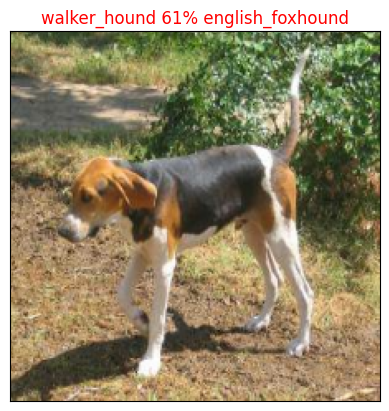

In [109]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n = 42)

In [110]:
## Let's visualize top 10 predictions made by the model.

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Visualize top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  top_5_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_5_pred_values = pred_prob[top_5_pred_indexes]
  top_5_pred_labels = unique_breeds[top_5_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_5_pred_labels)),
                     top_5_pred_values,
                     color="black")
  plt.xticks(np.arange(len(top_5_pred_labels)),
             labels=top_5_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_5_pred_labels):
    top_plot[np.argmax(top_5_pred_labels == true_label)].set_color("green")
  else:
    pass


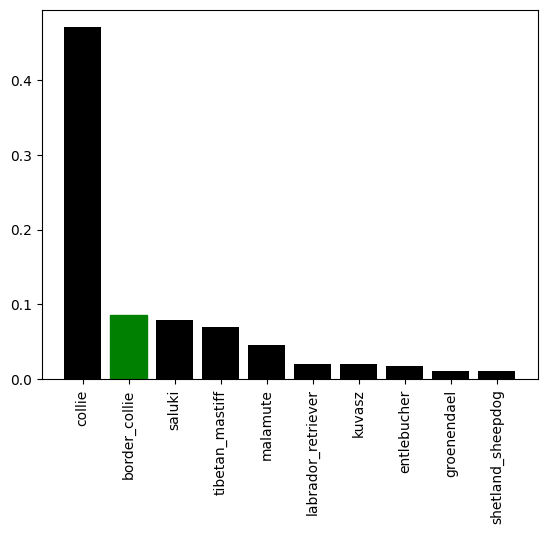

In [111]:
plot_pred_conf(prediction_probabilities = predictions,
                labels = val_labels,
                n=9)

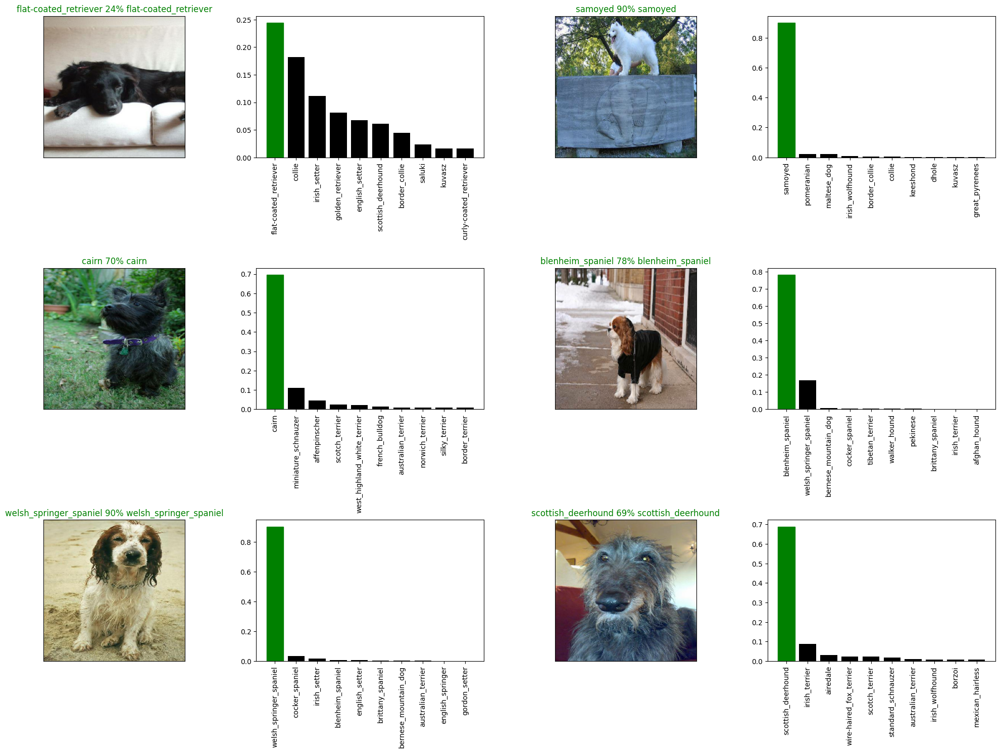

In [112]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images=val_images,
            n = i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [113]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:\n", cm)

NameError: name 'y_true' is not defined

## Saving and reloading a trained model


In [62]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """

  modeldir = os.path.join("drive/MyDrive/Dog_vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model")
  model.save(model_path)
  return model_path

In [63]:
# Create a function to load a trianed model
def load_model(model_path):
  """
  Loads a pre trained model
  """
  print(f"Loading the previous trained model from {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [64]:
# Saving the trained model trained on the 1000 images.
save_model(model, suffix="1000-images-mobilenetV2-Adam")

Saving model


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_vision/models/20250906-092751-1000-images-mobilenetV2-Adam.h5'

In [65]:
# Loading the model
loaded_1000_image_model = load_model("drive/MyDrive/Dog_vision/models/20250824-155959-1000-images-mobilenetV2-Adam.h5")

Loading the previous trained model from drive/MyDrive/Dog_vision/models/20250824-155959-1000-images-mobilenetV2-Adam.h5


In [66]:
model.evaluate(val_data)

10/10 [==============================] - 2s 147ms/step - loss: 5.8419 - accuracy: 0.0033


[5.841945171356201, 0.0033333334140479565]

In [67]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

10/10 [==============================] - 2s 104ms/step - loss: 1.5285 - accuracy: 0.6500


[1.5284523963928223, 0.6499999761581421]

## Training a model on the entire dataset

In [68]:
# Training the big dog model (on the full data)
len(X), len(y)

(10222, 10222)

In [69]:
X[:10]

['drive/MyDrive/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [70]:
len(X_train)

700

In [71]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [72]:
# Create a model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [73]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation dataset when training on the entire dataset, so we can't montior using validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

May take a little longer because GPU needs to load the entire dataset into memory in the first epoch.

In [ ]:
# # Fitting the model on the data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 47s 127ms/step - loss: 1.3181 - accuracy: 0.6705
Epoch 2/100
320/320 [==============================] - 40s 125ms/step - loss: 0.3987 - accuracy: 0.8828
Epoch 3/100
320/320 [==============================] - 42s 132ms/step - loss: 0.2342 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 40s 124ms/step - loss: 0.1529 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 37s 117ms/step - loss: 0.1075 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0766 - accuracy: 0.9859
Epoch 7/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0581 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0461 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0373 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 39s 122m

In [ ]:
save_model(full_model, suffix="full_image_set_mobilenetV2_Adam")

Saving model


'drive/MyDrive/Dog_vision/models/20250824-161508-full_image_set_mobilenetV2_Adam.h5'

In [74]:
loaded_full_model = load_model("drive/MyDrive/Dog_vision/models/20250824-161508-full_image_set_mobilenetV2_Adam.h5")

Loading the previous trained model from drive/MyDrive/Dog_vision/models/20250824-161508-full_image_set_mobilenetV2_Adam.h5


## Making predictions on the test dataset

In [75]:
## To make predictions on the test dataset, we have to convert the images into the same format as the input images.

# loading the test images filenames
test_path = "drive/MyDrive/Dog_vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_vision/test/ddfbebe13aa8fba30f347c58466215df.jpg',
 'drive/MyDrive/Dog_vision/test/e4fc0f20883984209dd64dff54dc89a0.jpg',
 'drive/MyDrive/Dog_vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 'drive/MyDrive/Dog_vision/test/deac194013c246095f0e88cd8b6b90d2.jpg',
 'drive/MyDrive/Dog_vision/test/e402619cf0a1766811068db0dd42fbae.jpg',
 'drive/MyDrive/Dog_vision/test/e55d2fced9eb7e46aef5bdb288145fa4.jpg',
 'drive/MyDrive/Dog_vision/test/df92d68c07ec91b2f67cec77980e00cf.jpg',
 'drive/MyDrive/Dog_vision/test/e6a544a538088cc3f73b432a2da90134.jpg',
 'drive/MyDrive/Dog_vision/test/e079440ee0061b92ec22faf17be13908.jpg',
 'drive/MyDrive/Dog_vision/test/e181bd9b192ab7b21b851a643c53c817.jpg']

In [76]:
len(test_filenames)

10357

In [77]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [78]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** It may take a lot of time.

In [79]:
# Making predictions
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 243s 730ms/step


In [ ]:
# Save predictions to csv file
np.savetxt("drive/MyDrive/Dog_vision/preds_array.csv", test_predictions, delimiter=",")

In [80]:
# Load predictions from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog_vision/preds_array.csv", delimiter=",")

In [81]:
test_predictions[:10]

array([[1.01123276e-11, 2.15108723e-10, 3.69283840e-11, ...,
        2.27173523e-11, 2.13806861e-09, 9.94537430e-09],
       [2.83323573e-07, 4.86026227e-04, 9.18691796e-07, ...,
        3.77128174e-07, 7.46316891e-06, 2.88754207e-04],
       [1.33650711e-14, 7.59516995e-15, 2.94926084e-09, ...,
        8.31452129e-10, 2.90304381e-09, 4.95038299e-12],
       ...,
       [2.62905821e-12, 5.38371070e-10, 1.74872889e-06, ...,
        6.92977628e-05, 1.38111611e-08, 3.40631412e-11],
       [8.93449273e-11, 6.05364425e-10, 2.17725848e-13, ...,
        1.52922075e-14, 8.19154857e-14, 1.70793298e-13],
       [1.57088871e-05, 5.97394287e-11, 2.59840593e-09, ...,
        8.05640266e-09, 7.68204500e-10, 4.40405934e-08]])

In [82]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

In [83]:
# Create a pandas DataFrame with empty columns
sample_submission = pd.DataFrame(columns=["id"] + list(unique_breeds))
sample_submission.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [84]:
test_filenames

['drive/MyDrive/Dog_vision/test/ddfbebe13aa8fba30f347c58466215df.jpg',
 'drive/MyDrive/Dog_vision/test/e4fc0f20883984209dd64dff54dc89a0.jpg',
 'drive/MyDrive/Dog_vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 'drive/MyDrive/Dog_vision/test/deac194013c246095f0e88cd8b6b90d2.jpg',
 'drive/MyDrive/Dog_vision/test/e402619cf0a1766811068db0dd42fbae.jpg',
 'drive/MyDrive/Dog_vision/test/e55d2fced9eb7e46aef5bdb288145fa4.jpg',
 'drive/MyDrive/Dog_vision/test/df92d68c07ec91b2f67cec77980e00cf.jpg',
 'drive/MyDrive/Dog_vision/test/e6a544a538088cc3f73b432a2da90134.jpg',
 'drive/MyDrive/Dog_vision/test/e079440ee0061b92ec22faf17be13908.jpg',
 'drive/MyDrive/Dog_vision/test/e181bd9b192ab7b21b851a643c53c817.jpg',
 'drive/MyDrive/Dog_vision/test/dcb5d319bd013bbfa9779d8c6c11a829.jpg',
 'drive/MyDrive/Dog_vision/test/f51f6aeea8a23b6bd62728fde8f04ad8.jpg',
 'drive/MyDrive/Dog_vision/test/ef7462aaef0907fbe406e23a4462f086.jpg',
 'drive/MyDrive/Dog_vision/test/edd5c8d96746d4af7eed0550eafd4b90.jpg',
 'driv

In [85]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['ddfbebe13aa8fba30f347c58466215df',
 'e4fc0f20883984209dd64dff54dc89a0',
 'e76a7a1d23d687b5015b07df762c0c10',
 'deac194013c246095f0e88cd8b6b90d2',
 'e402619cf0a1766811068db0dd42fbae',
 'e55d2fced9eb7e46aef5bdb288145fa4',
 'df92d68c07ec91b2f67cec77980e00cf',
 'e6a544a538088cc3f73b432a2da90134',
 'e079440ee0061b92ec22faf17be13908',
 'e181bd9b192ab7b21b851a643c53c817']

In [86]:
sample_submission["id"] = test_ids
sample_submission.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddfbebe13aa8fba30f347c58466215df,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e4fc0f20883984209dd64dff54dc89a0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e76a7a1d23d687b5015b07df762c0c10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,deac194013c246095f0e88cd8b6b90d2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e402619cf0a1766811068db0dd42fbae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
# Add the prediction probabilities to each dog breed column
sample_submission[list(unique_breeds)] = test_predictions
sample_submission.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddfbebe13aa8fba30f347c58466215df,1.011233e-11,2.151087e-10,3.692838e-11,7.333105e-09,5.487324e-08,1.485903e-07,1.242050e-08,6.296286e-09,3.955631e-07,...,2.929173e-09,8.557564e-10,3.661694e-09,2.528101e-05,1.267630e-07,2.638934e-09,1.872133e-10,2.271735e-11,2.138069e-09,9.945374e-09
1,e4fc0f20883984209dd64dff54dc89a0,2.833236e-07,4.860262e-04,9.186918e-07,5.478775e-05,6.700818e-07,4.264546e-09,1.377168e-02,3.073608e-08,7.269262e-10,...,5.841287e-07,5.878520e-08,1.115282e-06,2.246800e-08,1.128282e-06,1.165818e-05,3.747123e-10,3.771282e-07,7.463169e-06,2.887542e-04
2,e76a7a1d23d687b5015b07df762c0c10,1.336507e-14,7.595170e-15,2.949261e-09,5.480496e-15,5.445923e-11,3.098476e-10,1.209465e-09,1.031778e-06,2.733894e-11,...,4.086907e-11,1.239286e-07,2.215607e-13,1.204128e-11,3.078721e-12,5.795084e-12,2.048079e-12,8.314521e-10,2.903044e-09,4.950383e-12
3,deac194013c246095f0e88cd8b6b90d2,1.001958e-07,7.279729e-07,4.420955e-08,8.914595e-08,1.813865e-06,9.194421e-07,4.591202e-05,8.110791e-09,2.592403e-06,...,3.763712e-07,8.866842e-08,3.263534e-08,1.269953e-09,3.020764e-08,3.031243e-09,1.196328e-06,2.442002e-07,4.416723e-04,1.084188e-05
4,e402619cf0a1766811068db0dd42fbae,9.868828e-09,1.582921e-10,5.059043e-10,1.047666e-08,2.194937e-10,7.131041e-08,4.108931e-08,1.523853e-09,3.715258e-10,...,4.940490e-11,1.741367e-09,1.476194e-06,1.522254e-06,5.114132e-09,6.434668e-05,5.257450e-11,2.827217e-10,2.230314e-07,3.035443e-09


In [88]:
# Save our predictions dataframe to CSV
sample_submission.to_csv("drive/MyDrive/Dog_vision/full_model_predictions_submission_1_mobilenetV2.csv",
                        index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches, and set `test_data` to true for custom images.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [89]:
custom_path = "drive/ MyDrive/Dog_vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [90]:
custom_image_paths

['drive/ MyDrive/Dog_vision/my-dog-photos/dog_photo.jpg']

In [91]:
# Turn custom image into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [92]:
# Make predictions
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 728ms/step


In [93]:
custom_preds.shape

(1, 120)

In [94]:
# Get label for custom image
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever']

In [95]:
# Get custom images
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

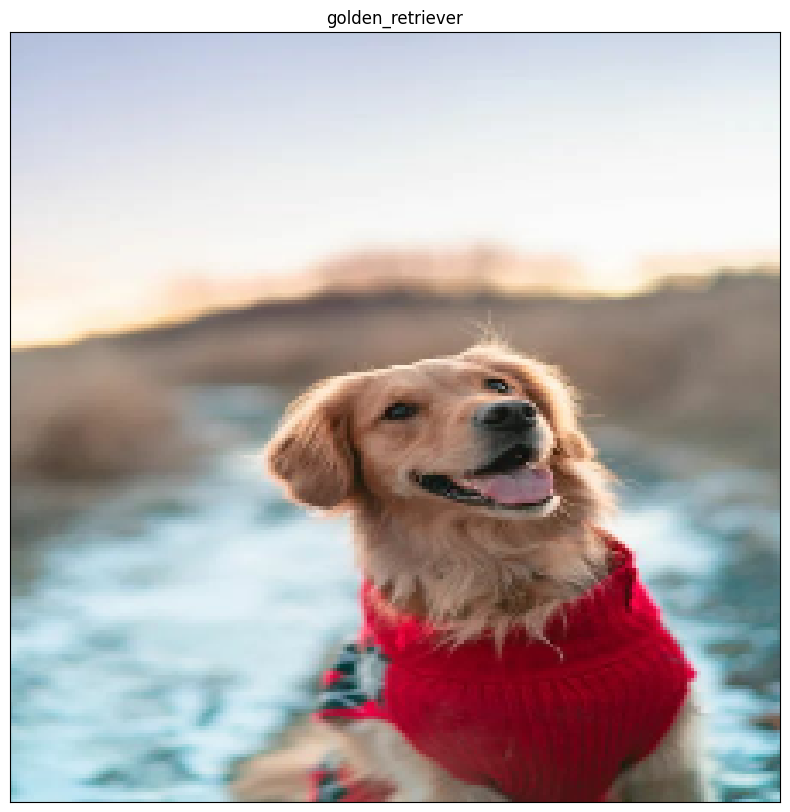

In [114]:
# Checking custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 1, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)